In [40]:
import plotly.express as px
from ydata_profiling import ProfileReport
import pandas as pd

%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt

## Configure PGF Backend

Configure matplotlib to use the PGF backend with LaTeX text rendering for publication-quality output.

In [41]:
mpl.use("pgf")  # use PGF backend

# Update matplotlib parameters for LaTeX compatibility
mpl.rcParams.update({
    "pgf.rcfonts": False,         # don't override LaTeX fonts
    "text.usetex": True,          # LaTeX for all text
    "font.family": "serif",       # match your LaTeX doc
    "font.size": 18,              # will scale nicely in LaTeX
})

## Load Spotify Dataset
Spotify dataset: <a href="https://www.kaggle.com/datasets/maharshipandya/-spotify-tracks-dataset/data">https://www.kaggle.com/datasets/maharshipandya/-spotify-tracks-dataset/data</a>

In [42]:
df_spotify = pd.read_csv("../data/spotify.csv")

In [43]:
# Create a profile report
profile = ProfileReport(df_spotify, title="🎹 Spotify Tracks Dataset", explorative=True)
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 21/21 [00:01<00:00, 17.12it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Features analysis

#### **artists**
The artists' names who performed the track. \
If there is more than one artist, they are separated by a ";"

In [44]:
# As written inside the report, we can see that there's a single missing value
df_spotify['artists'].isnull().sum()

1

In [45]:
df_spotify[df_spotify['artists'].isnull()]

,id,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,...,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
65900,65900,1kR4gIb7nGxHPI3D2ifs59,NaN,NaN,NaN,0,0,False,0.501,0.583,...,-9.46,0,0.0605,0.69,0.00396,0.0747,0.734,138.391,4,k-pop


Since it's the only row with missing values and the only one with meaningless features, we can just remove it

In [46]:
df_spotify = df_spotify.drop(df_spotify[df_spotify['track_id'] == "1kR4gIb7nGxHPI3D2ifs59"].index)

In [47]:
df_spotify['artists'].isnull().sum()

0

#### **album_name**
The album name in which the track appears

#### **track_name**
Name of the track

#### **popularity**
The popularity of a track is a value between 0 and 100, with 100 being the most popular. \
The popularity is calculated by Spotify and is based, in the most part, on the total number of plays the track has had and how recent those plays are. 

Generally speaking, songs that are being played a lot now will have a higher popularity than songs that were played a lot in the past.

Duplicate tracks (e.g. the same track from a single and an album) are rated independently. 

Artist and album popularity is derived mathematically from track popularity.

/var/folders/32/cjb5rw_97rjb1kkd58x5p4q80000gn/T/ipykernel_61763/2137290700.py:6: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


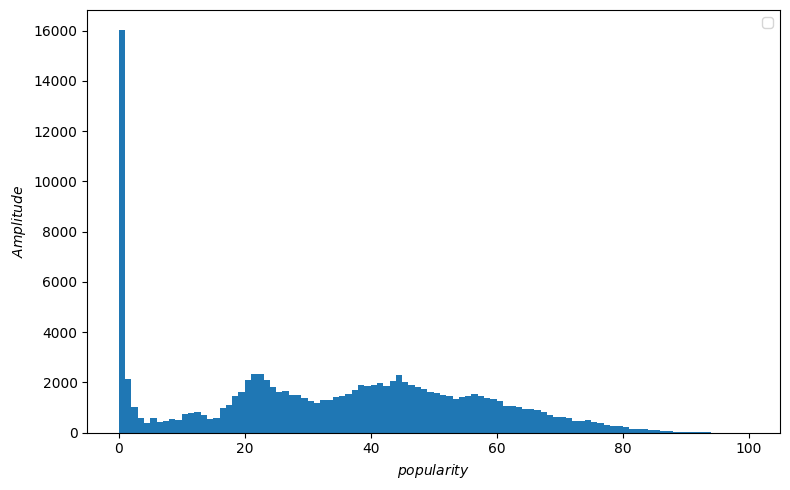

In [67]:
# Create the plot
plt.figure(figsize=(8, 5))    # ~ column width in inches
plt.hist(x=df_spotify['popularity'], bins=100)
plt.xlabel(r"$popularity$")
plt.ylabel(r"$Amplitude$")
plt.legend()
plt.tight_layout()

plt.savefig("../img/popularity_count.pgf") 

#### **duration_ms**
The track length in milliseconds

/var/folders/32/cjb5rw_97rjb1kkd58x5p4q80000gn/T/ipykernel_61763/2670263801.py:9: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


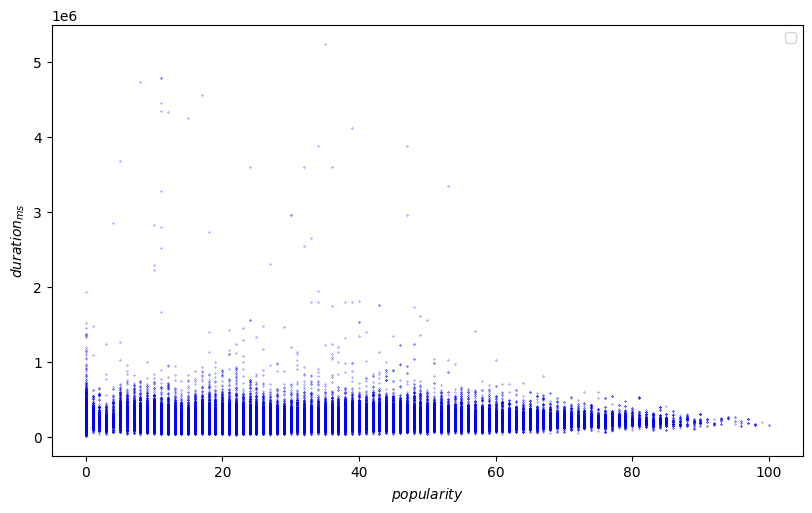

In [100]:
plt.figure(figsize=(8, 5))
plt.scatter(
        df_spotify['popularity'],
        df_spotify['duration_ms'],
        s=0.05, 
        marker='o',
        color='blue'
    )
plt.legend()
plt.tight_layout()
plt.xlabel(r"$popularity$")
plt.ylabel(r"$duration_{ms}$")
plt.savefig("../img/popularity_vs_features/popularity_vs_durationms.pgf") 

#### **explicit**
Whether or not the track has explicit lyrics:
* true = *yes it does*
* false = *no it does not* OR *unknown*

/var/folders/32/cjb5rw_97rjb1kkd58x5p4q80000gn/T/ipykernel_61763/3208736742.py:9: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


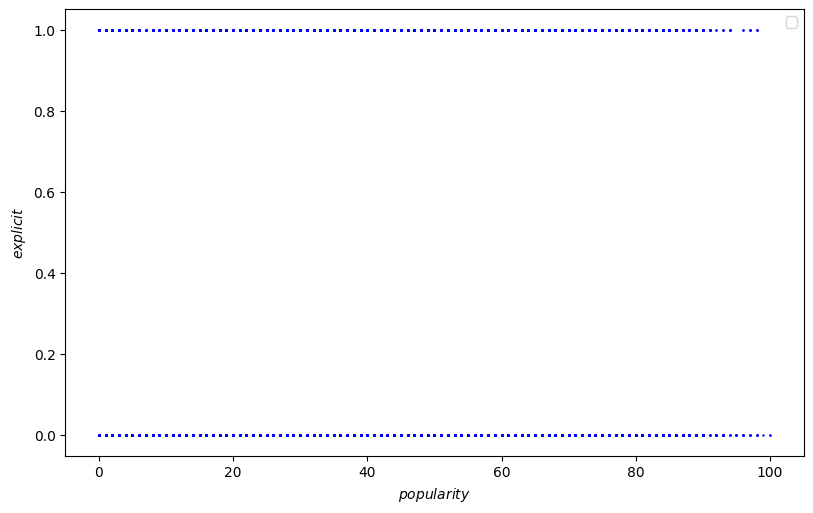

In [103]:
plt.figure(figsize=(8, 5))
plt.scatter(
        df_spotify['popularity'],
        df_spotify['explicit'],
        s=0.5, 
        marker='o',
        color='blue'
    )
plt.legend()
plt.tight_layout()
plt.xlabel(r"$popularity$")
plt.ylabel(r"$explicit$")
plt.savefig("../img/popularity_vs_features/popularity_vs_explicit.pgf") 

#### **danceability**
Danceability describes how suitable a track is for dancing based on a combination of musical elements including *tempo*, *rhythm stability*, *beat strength*, and *overall regularity*.

A value of 0.0 is least danceable and 1.0 is most danceable

/var/folders/32/cjb5rw_97rjb1kkd58x5p4q80000gn/T/ipykernel_61763/2478584846.py:9: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


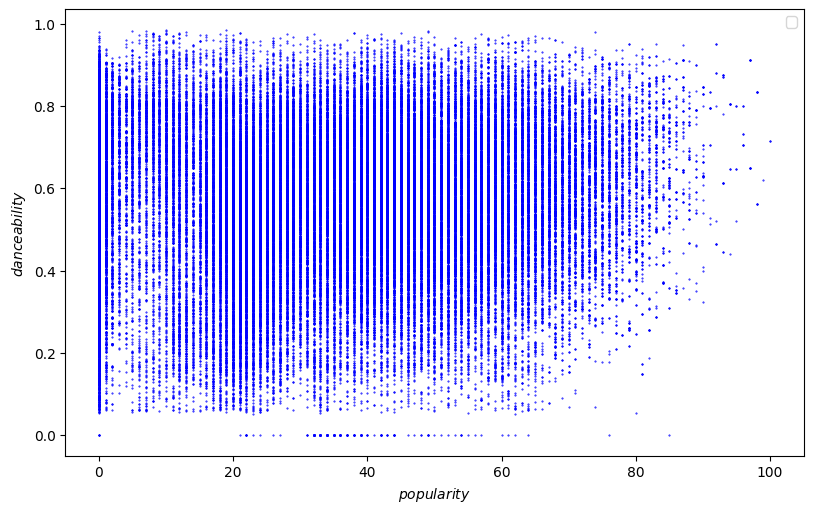

In [107]:
plt.figure(figsize=(8, 5))
plt.scatter(
        df_spotify['popularity'],
        df_spotify['danceability'],
        s=0.2, 
        marker='o',
        color='blue'
    )
plt.legend()
plt.tight_layout()
plt.xlabel(r"$popularity$")
plt.ylabel(r"$danceability$")
plt.savefig("../img/popularity_vs_features/popularity_vs_danceability.pgf") 

#### **energy**
Energy is a measure from 0.0 to 1.0 and represents a perceptual measure of intensity and activity. \
Typically, energetic tracks feel fast, loud, and noisy. 

*For example, death metal has high energy, while a Bach prelude scores low on the scale*

/var/folders/32/cjb5rw_97rjb1kkd58x5p4q80000gn/T/ipykernel_61763/2197221888.py:9: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


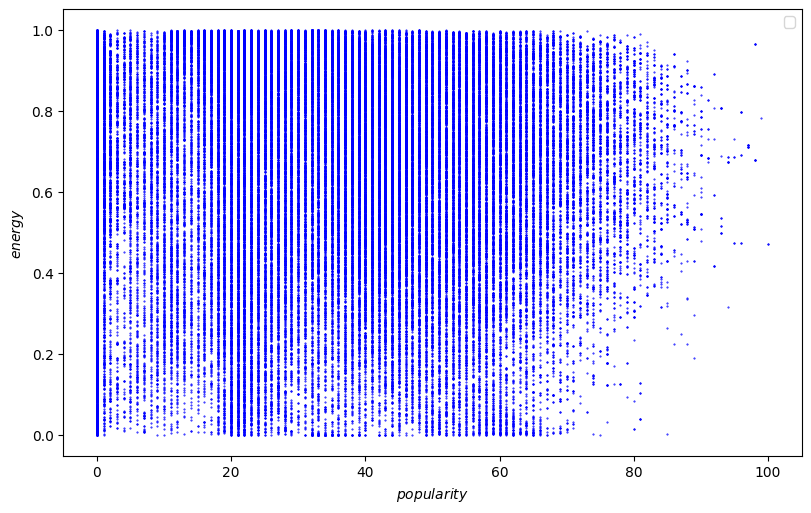

In [108]:
plt.figure(figsize=(8, 5))
plt.scatter(
        df_spotify['popularity'],
        df_spotify['energy'],
        s=0.2, 
        marker='o',
        color='blue'
    )
plt.legend()
plt.tight_layout()
plt.xlabel(r"$popularity$")
plt.ylabel(r"$energy$")
plt.savefig("../img/popularity_vs_features/popularity_vs_energy.pgf") 

#### **key**
The key the track is in. 

Integers map to pitches using standard Pitch Class notation. \
*E.g. 0 = C, 1 = C♯/D♭, 2 = D, and so on.*

If no key was detected, the value is -1

/var/folders/32/cjb5rw_97rjb1kkd58x5p4q80000gn/T/ipykernel_61763/2232273087.py:9: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


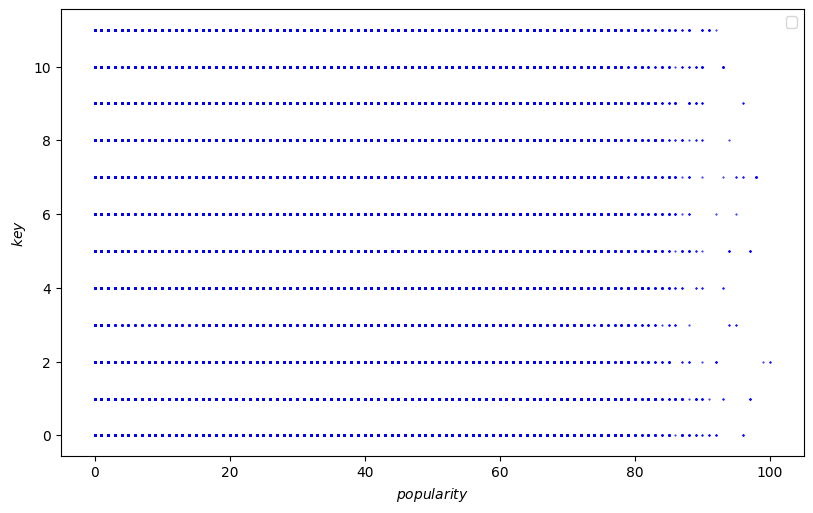

In [109]:
plt.figure(figsize=(8, 5))
plt.scatter(
        df_spotify['popularity'],
        df_spotify['key'],
        s=0.2, 
        marker='o',
        color='blue'
    )
plt.legend()
plt.tight_layout()
plt.xlabel(r"$popularity$")
plt.ylabel(r"$key$")
plt.savefig("../img/popularity_vs_features/popularity_vs_key.pgf") 

#### **loudness**
The overall loudness of a track in decibels (dB).

Actually we found that this value is normalized from Spotify (source: <a href="https://support.spotify.com/us/artists/article/loudness-normalization/">https://support.spotify.com/us/artists/article/loudness-normalization/</a>) \
which makes sense, otherwise all the values seemed to be "strange"

/var/folders/32/cjb5rw_97rjb1kkd58x5p4q80000gn/T/ipykernel_61763/1155798821.py:9: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


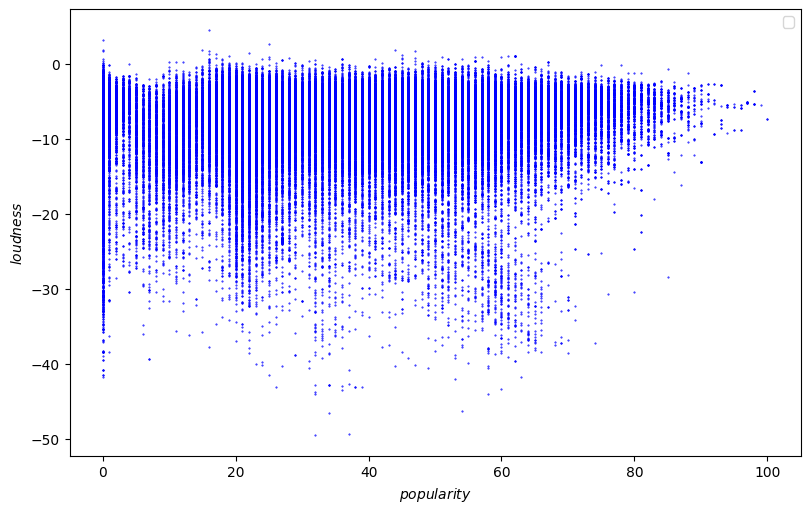

In [110]:
plt.figure(figsize=(8, 5))
plt.scatter(
        df_spotify['popularity'],
        df_spotify['loudness'],
        s=0.2, 
        marker='o',
        color='blue'
    )
plt.legend()
plt.tight_layout()
plt.xlabel(r"$popularity$")
plt.ylabel(r"$loudness$")
plt.savefig("../img/popularity_vs_features/popularity_vs_loudness.pgf") 

#### **mode**
Mode indicates the modality (major or minor) of a track, the type of scale from which its melodic content is derived. \
Major is represented by 1 and minor is 0

/var/folders/32/cjb5rw_97rjb1kkd58x5p4q80000gn/T/ipykernel_61763/4040777089.py:9: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


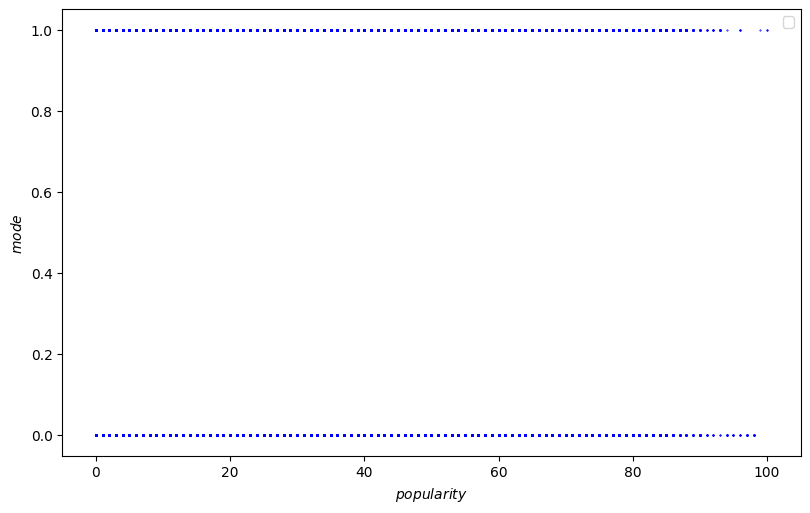

In [111]:
plt.figure(figsize=(8, 5))
plt.scatter(
        df_spotify['popularity'],
        df_spotify['mode'],
        s=0.2, 
        marker='o',
        color='blue'
    )
plt.legend()
plt.tight_layout()
plt.xlabel(r"$popularity$")
plt.ylabel(r"$mode$")
plt.savefig("../img/popularity_vs_features/popularity_vs_mode.pgf") 

#### **speechiness**
Speechiness detects the presence of spoken words in a track. \
The more exclusively speech-like the recording (e.g. talk show, audio book, poetry), the closer to 1.0 the attribute value. \
Values above 0.66 describe tracks that are probably made entirely of spoken words. \
Values between 0.33 and 0.66 describe tracks that may contain both music and speech, either in sections or layered, including such cases as rap music. \
Values below 0.33 most likely represent music and other non-speech-like tracks

/var/folders/32/cjb5rw_97rjb1kkd58x5p4q80000gn/T/ipykernel_61763/537034050.py:9: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


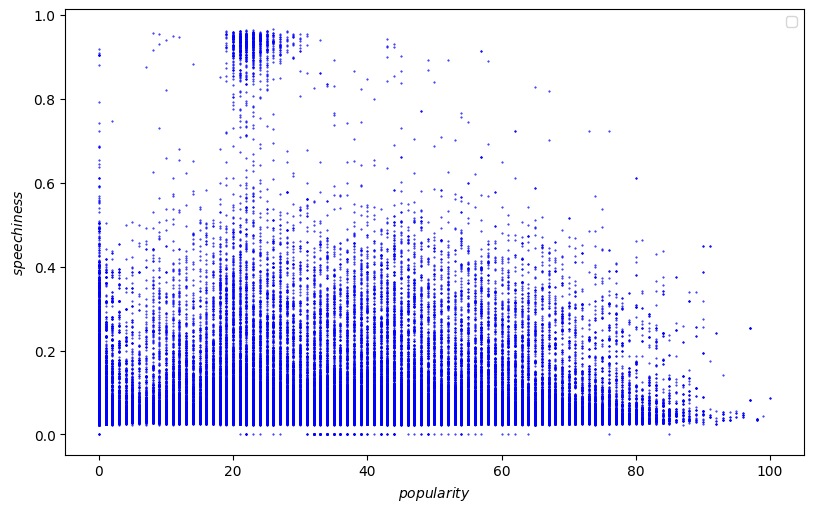

In [114]:
plt.figure(figsize=(8, 5))
plt.scatter(
        df_spotify['popularity'],
        df_spotify['speechiness'],
        s=0.2, 
        marker='o',
        color='blue'
    )
plt.legend()
plt.tight_layout()
plt.xlabel(r"$popularity$")
plt.ylabel(r"$speechiness$")
plt.savefig("../img/popularity_vs_features/popularity_vs_speechiness.pgf") 

#### **acousticness**
A confidence measure from 0.0 to 1.0 of whether the track is acoustic. \
1.0 represents high confidence the track is acoustic

/var/folders/32/cjb5rw_97rjb1kkd58x5p4q80000gn/T/ipykernel_61763/1946313092.py:9: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


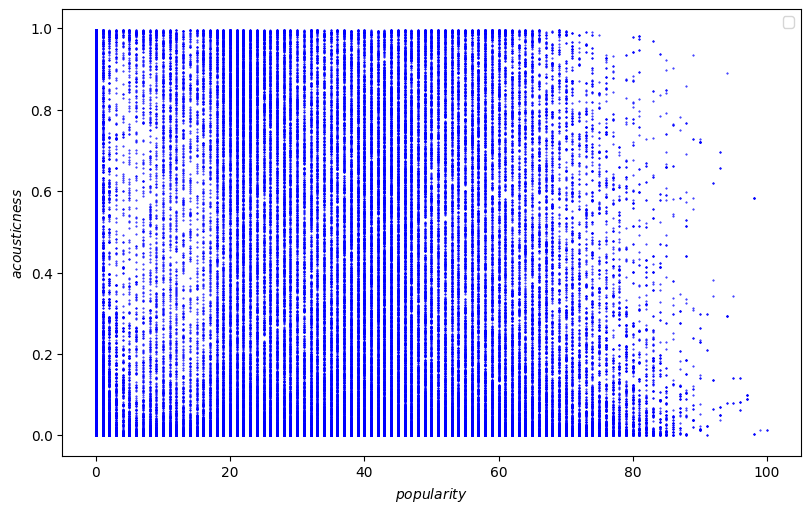

In [117]:
plt.figure(figsize=(8, 5))
plt.scatter(
        df_spotify['popularity'],
        df_spotify['acousticness'],
        s=0.2, 
        marker='o',
        color='blue'
    )
plt.legend()
plt.tight_layout()
plt.xlabel(r"$popularity$")
plt.ylabel(r"$acousticness$")
plt.savefig("../img/popularity_vs_features/popularity_vs_acousticness.pgf") 

#### **instrumentalness**
Predicts whether a track contains no vocals.

*"Ooh" and "aah" sounds are treated as instrumental in this context.* \
*Rap or spoken word tracks are clearly "vocal".* 

The closer the instrumentalness value is to 1.0, the greater likelihood the track contains no vocal content

/var/folders/32/cjb5rw_97rjb1kkd58x5p4q80000gn/T/ipykernel_61763/1792245328.py:9: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


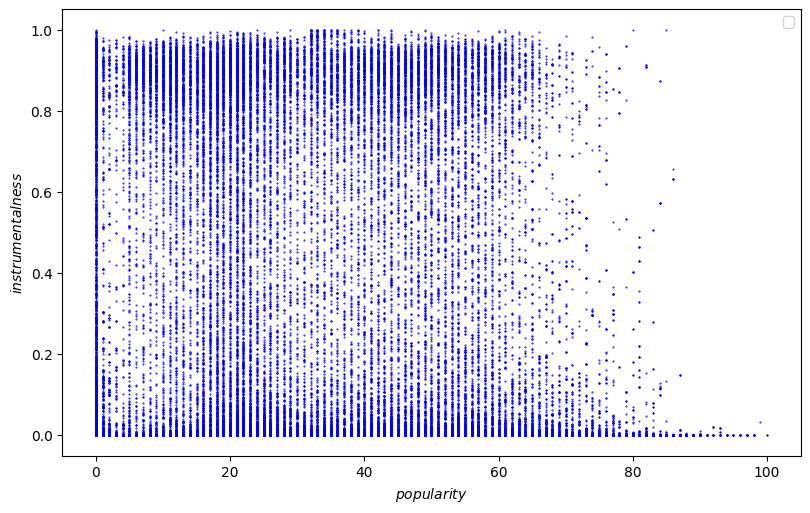

In [118]:
plt.figure(figsize=(8, 5))
plt.scatter(
        df_spotify['popularity'],
        df_spotify['instrumentalness'],
        s=0.2, 
        marker='o',
        color='blue'
    )
plt.legend()
plt.tight_layout()
plt.xlabel(r"$popularity$")
plt.ylabel(r"$instrumentalness$")
plt.savefig("../img/popularity_vs_features/popularity_vs_instrumentalness.pgf") 

#### **liveness**
Detects the presence of an audience in the recording. \
Higher liveness values represent an increased probability that the track was performed live. 

A value above 0.8 provides strong likelihood that the track is live

/var/folders/32/cjb5rw_97rjb1kkd58x5p4q80000gn/T/ipykernel_61763/1718085194.py:9: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


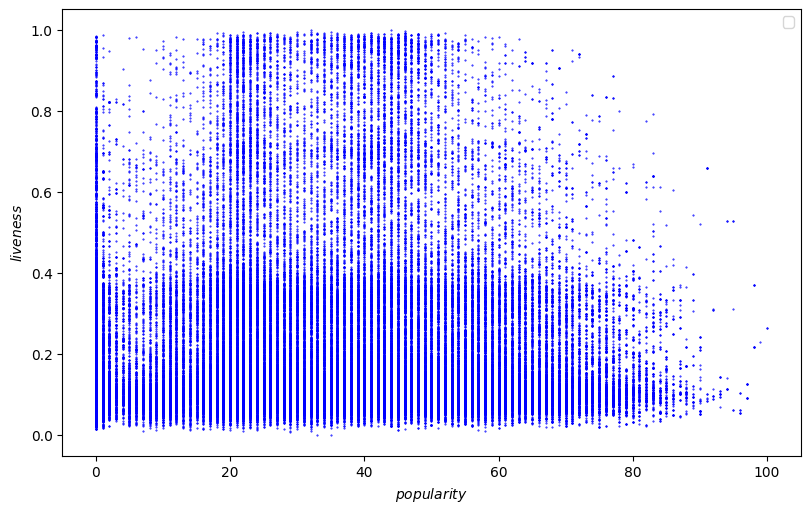

In [119]:
plt.figure(figsize=(8, 5))
plt.scatter(
        df_spotify['popularity'],
        df_spotify['liveness'],
        s=0.2, 
        marker='o',
        color='blue'
    )
plt.legend()
plt.tight_layout()
plt.xlabel(r"$popularity$")
plt.ylabel(r"$liveness$")
plt.savefig("../img/popularity_vs_features/popularity_vs_liveness.pgf") 

#### **valence**
A measure from 0.0 to 1.0 describing the musical positiveness conveyed by a track.

Tracks with high valence sound more positive (e.g. happy, cheerful, euphoric), while tracks with low valence sound more negative (e.g. sad, depressed, angry)

/var/folders/32/cjb5rw_97rjb1kkd58x5p4q80000gn/T/ipykernel_61763/3438879163.py:9: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


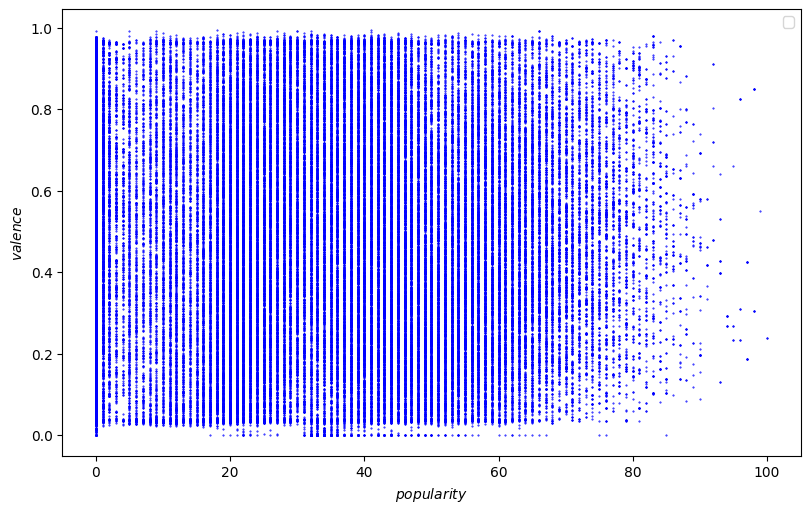

In [120]:
plt.figure(figsize=(8, 5))
plt.scatter(
        df_spotify['popularity'],
        df_spotify['valence'],
        s=0.2, 
        marker='o',
        color='blue'
    )
plt.legend()
plt.tight_layout()
plt.xlabel(r"$popularity$")
plt.ylabel(r"$valence$")
plt.savefig("../img/popularity_vs_features/popularity_vs_valence.pgf") 

#### **tempo**
The overall estimated tempo of a track in beats per minute (BPM).

In musical terminology, tempo is the speed or pace of a given piece and derives directly from the average beat duration

/var/folders/32/cjb5rw_97rjb1kkd58x5p4q80000gn/T/ipykernel_61763/516018403.py:9: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


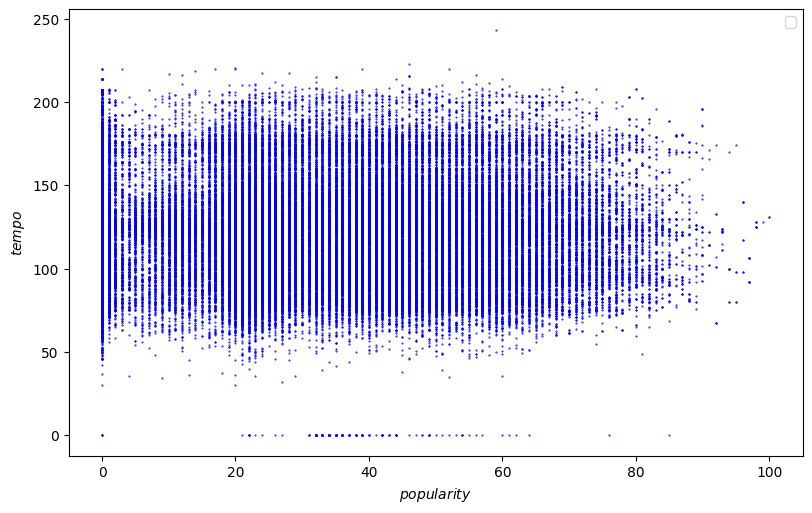

In [121]:
plt.figure(figsize=(8, 5))
plt.scatter(
        df_spotify['popularity'],
        df_spotify['tempo'],
        s=0.2, 
        marker='o',
        color='blue'
    )
plt.legend()
plt.tight_layout()
plt.xlabel(r"$popularity$")
plt.ylabel(r"$tempo$")
plt.savefig("../img/popularity_vs_features/popularity_vs_tempo.pgf") 

#### **time_signature**
An estimated time signature. \
The time signature (meter) is a notational convention to specify how many beats are in each bar (or measure). 

The time signature ranges from 3 to 7 indicating time signatures of 3/4, to 7/4

/var/folders/32/cjb5rw_97rjb1kkd58x5p4q80000gn/T/ipykernel_61763/54491898.py:9: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


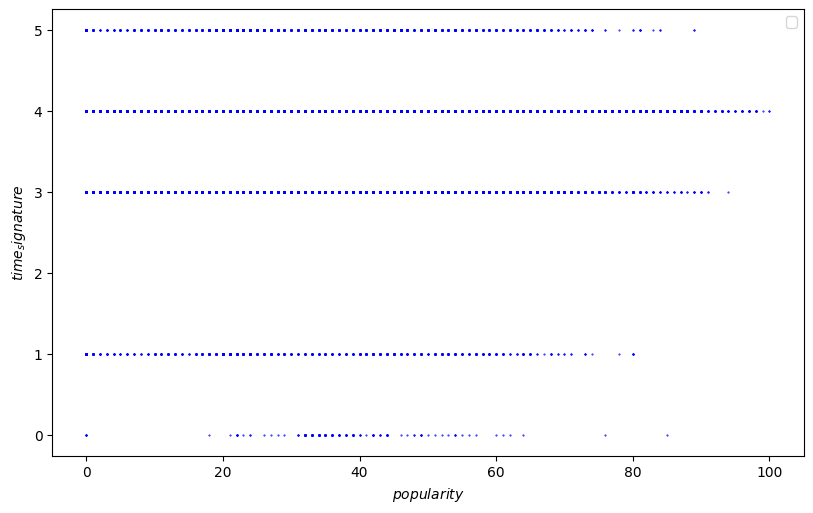

In [122]:
plt.figure(figsize=(8, 5))
plt.scatter(
        df_spotify['popularity'],
        df_spotify['time_signature'],
        s=0.2, 
        marker='o',
        color='blue'
    )
plt.legend()
plt.tight_layout()
plt.xlabel(r"$popularity$")
plt.ylabel(r"$time_signature$")
plt.savefig("../img/popularity_vs_features/popularity_vs_time_signature.pgf") 

#### **track_genre**
The genre in which the track belongs